In [1]:
import keras, os, time
from __future__ import division
from __future__ import print_function
from cs_dae.models_def import build_celebA_model
from cs_dae.data import get_celebA_data
import numpy as np
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

os.environ["CUDA_VISIBLE_DEVICES"] = "1"

Using TensorFlow backend.


## Train / Load DAE

In [2]:
#Build Model Graph
autoencoder = build_celebA_model()

In [3]:
#Get original train data (160000 images)
#x_train = get_celebA_data(train=True, train_data_dir='img_align_celeba/train/data/')

#Add noise for training 
#x_train_noisy = np.zeros(x_train.shape, dtype=np.float32)

#train
#x_train_noisy[:32000] = x_train[:32000] + 0.25*np.random.normal(loc=0.0, scale=1.0, size=(32000,64,64,3)) 
#x_train_noisy[32000:2*32000] = x_train[32000:2*32000] + 0.50*np.random.normal(loc=0.0, scale=1.0, size=(32000,64,64,3)) 
#x_train_noisy[2*32000:3*32000] = x_train[2*32000:3*32000] + 0.75*np.random.normal(loc=0.0, scale=1.0, size=(32000,64,64,3)) 
#x_train_noisy[3*32000:4*32000] = x_train[3*32000:4*32000] + 1.0*np.random.normal(loc=0.0, scale=1.0, size=(32000,64,64,3)) 
#x_train_noisy[4*32000:5*32000] = x_train[4*32000:5*32000] + 1.25*np.random.normal(loc=0.0, scale=1.0, size=(32000,64,64,3)) 

In [4]:
#Train model and save to disk
#%%capture training
#lr = 0.01
#autoencoder.compile(optimizer=keras.optimizers.Adam(lr), loss='mean_squared_error')
#autoencoder.fit(x_train_noisy, x_train,
#                epochs=400,
#                batch_size=128,
#                shuffle=True,
#                validation_data=(x_train_noisy[145000:150000], x_train[145000:150000]),)

#Note that you can use a separate validation set that is not part of the train set. 

#model_json = autoencoder.to_json()
#with open("celebA_autoencoder_full_data", "w") as json_file:
#    json_file.write(model_json)
    # serialize weights to HDF5
#    autoencoder.save_weights("celebA_autoencoder_full_data_weights")
#    print("Saved model to disk")

In [3]:
#Load model as per the saved file name above
model_def_file = 'celebA_autoencoder_full_data'
model_weight_file = 'celebA_autoencoder_full_data_weights'
json_file = open(model_def_file, 'r')
loaded_model_json = json_file.read()
json_file.close()
autoencoder.load_weights(model_weight_file)
print("Loaded model from disk")

Loaded model from disk


## Test DAE  on Noisy Images

In [7]:
#Get test data 10000 images)
x_test = get_celebA_data(test=True, test_data_dir='img_align_celeba/test/data/')

#Add noise for training 
x_test_noisy = np.zeros(x_test.shape, dtype=np.float32)
x_test_noisy = x_test + np.random.normal(loc=0.0, scale=1.0, size=x_test.shape) 


In [8]:
x_preds = autoencoder.predict(x_test_noisy)

## Original Test Images

[2113 7442 7286 6782 3176 1261 8201  757 6421 5792]


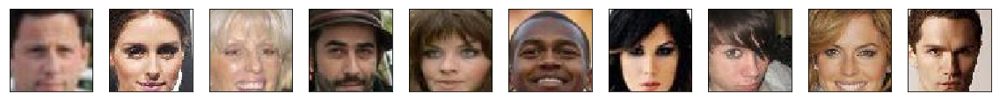

In [13]:
x_vis = np.random.choice(range(10000), size=10, replace=False)
print(x_vis)
plt.figure(figsize=(20, 2))
ctr =1
for i in x_vis:
    ax = plt.subplot(1, 10, ctr)
    plt.imshow(x_test[i].flatten().reshape(64,64,3))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ctr+=1
plt.show()

## Noisy Test Images

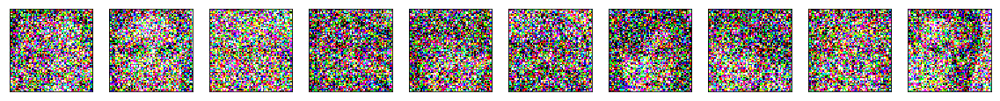

In [15]:
plt.figure(figsize=(20, 2))
ctr =1
for i in x_vis:
    ax = plt.subplot(1, 10, ctr)
    plt.imshow(x_test_noisy[i].flatten().reshape(64,64,3))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ctr+=1
plt.show()

## Denoised Test Images

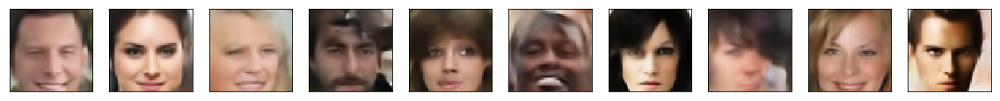

In [16]:
plt.figure(figsize=(20, 2))
ctr =1
for i in x_vis:
    ax = plt.subplot(1, 10, ctr)
    plt.imshow(x_preds[i].flatten().reshape(64,64,3))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ctr+=1
plt.show()

## Compressive Sensing: No Noise

In [5]:
from matplotlib import image


In [8]:
x_test = np.zeros((64, 64,64, 3),dtype=np.float32)

for i in range(182638,182638+64):
    fname = str(i)
    fname = fname.zfill(6)
    x_test[i-182638] = (image.imread('testing_images/celebA/data/' + fname + '.jpg')).reshape((64,64,3))/255.



In [9]:
A = (np.random.normal(0, 1/np.sqrt(1000), (1000, 12288)))
y = np.zeros((64,1000))
for i in range(64):
    y[i] = np.dot(A, x_test[i].flatten()) 

## Algorithm 1 : IPT

Test Image Name: 182638.jpg


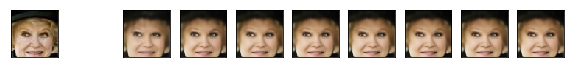

Test Image Name: 182639.jpg


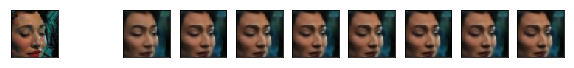

Test Image Name: 182640.jpg


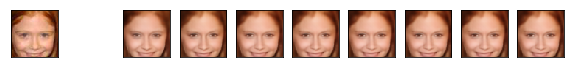

Test Image Name: 182641.jpg


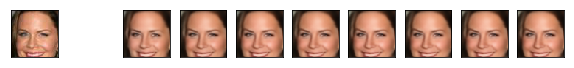

Test Image Name: 182642.jpg


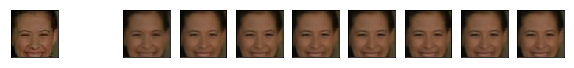

Test Image Name: 182643.jpg


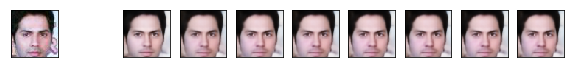

Test Image Name: 182644.jpg


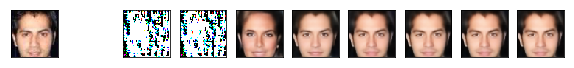

Test Image Name: 182645.jpg


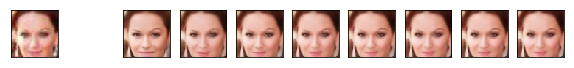

Test Image Name: 182646.jpg


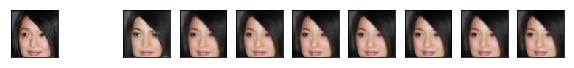

Test Image Name: 182647.jpg


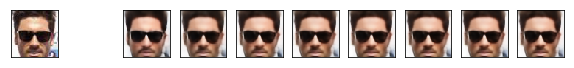

Test Image Name: 182648.jpg


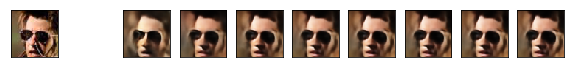

Test Image Name: 182649.jpg


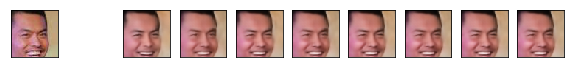

Test Image Name: 182650.jpg


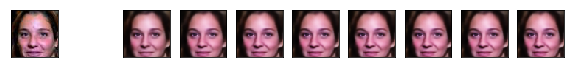

Test Image Name: 182651.jpg


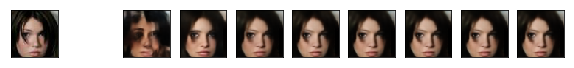

Test Image Name: 182652.jpg


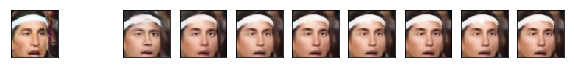

Test Image Name: 182653.jpg


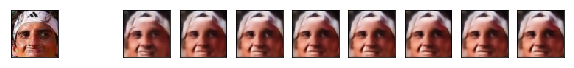

Test Image Name: 182654.jpg


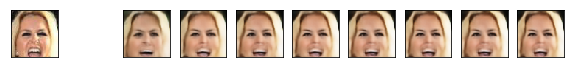

Test Image Name: 182655.jpg


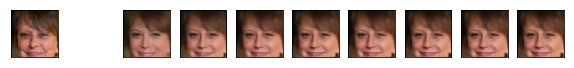

Test Image Name: 182656.jpg


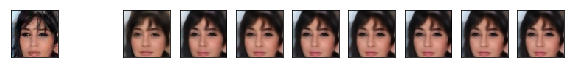

Test Image Name: 182657.jpg


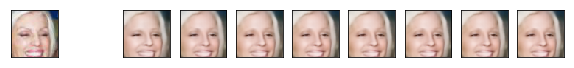

Test Image Name: 182658.jpg


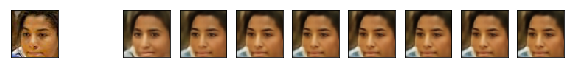

Test Image Name: 182659.jpg


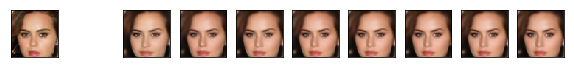

Test Image Name: 182660.jpg


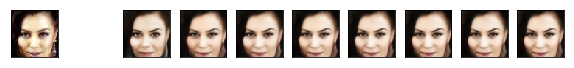

Test Image Name: 182661.jpg


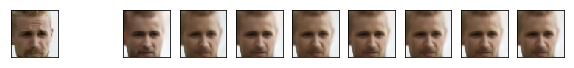

Test Image Name: 182662.jpg


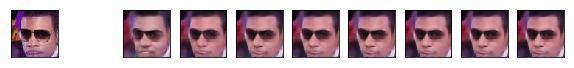

Test Image Name: 182663.jpg


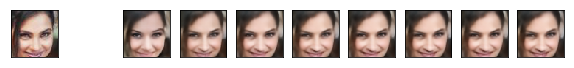

Test Image Name: 182664.jpg


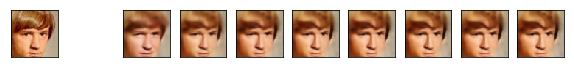

Test Image Name: 182665.jpg


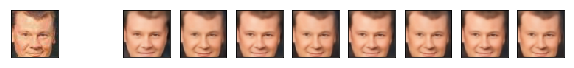

Test Image Name: 182666.jpg


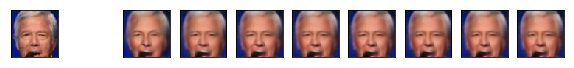

Test Image Name: 182667.jpg


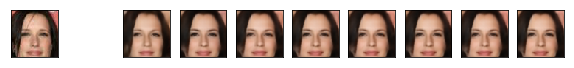

Test Image Name: 182668.jpg


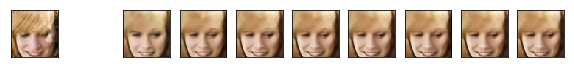

Test Image Name: 182669.jpg


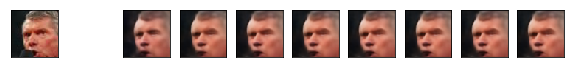

Test Image Name: 182670.jpg


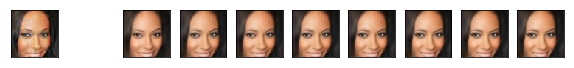

Test Image Name: 182671.jpg


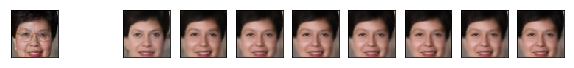

Test Image Name: 182672.jpg


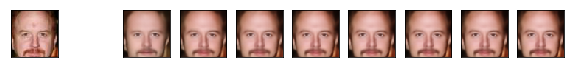

Test Image Name: 182673.jpg


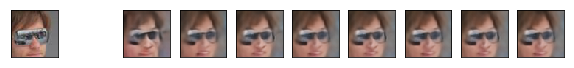

Test Image Name: 182674.jpg


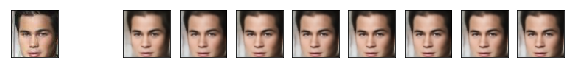

Test Image Name: 182675.jpg


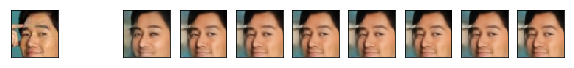

Test Image Name: 182676.jpg


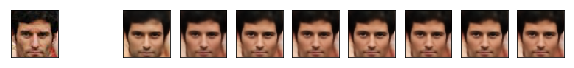

Test Image Name: 182677.jpg


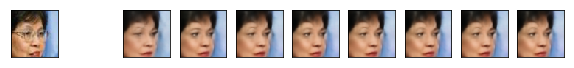

Test Image Name: 182678.jpg


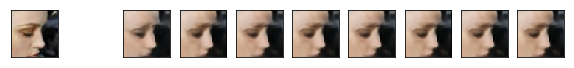

Test Image Name: 182679.jpg


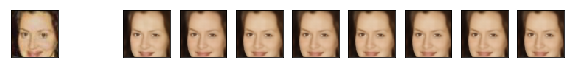

Test Image Name: 182680.jpg


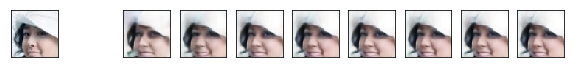

Test Image Name: 182681.jpg


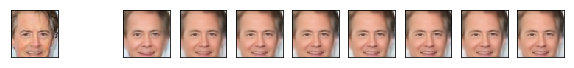

Test Image Name: 182682.jpg


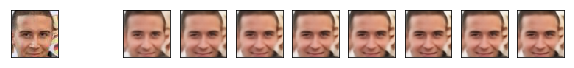

Test Image Name: 182683.jpg


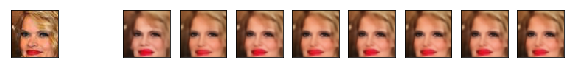

Test Image Name: 182684.jpg


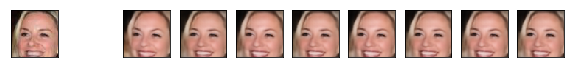

Test Image Name: 182685.jpg


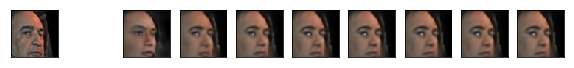

Test Image Name: 182686.jpg


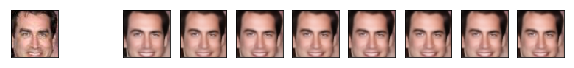

Test Image Name: 182687.jpg


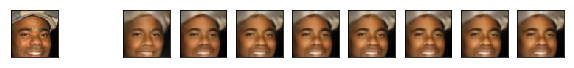

Test Image Name: 182688.jpg


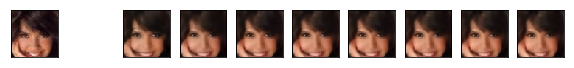

Test Image Name: 182689.jpg


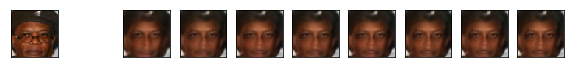

Test Image Name: 182690.jpg


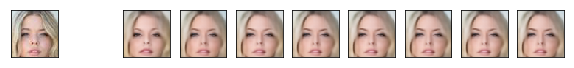

Test Image Name: 182691.jpg


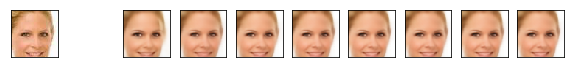

Test Image Name: 182692.jpg


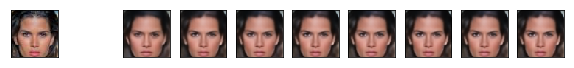

Test Image Name: 182693.jpg


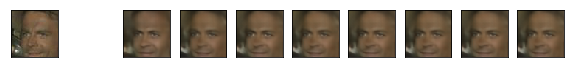

Test Image Name: 182694.jpg


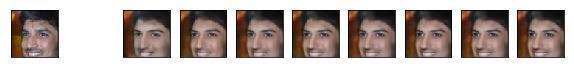

Test Image Name: 182695.jpg


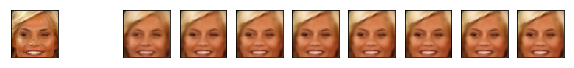

Test Image Name: 182696.jpg


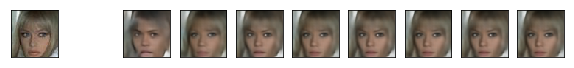

Test Image Name: 182697.jpg


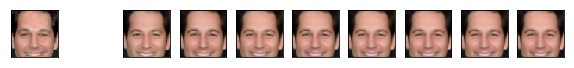

Test Image Name: 182698.jpg


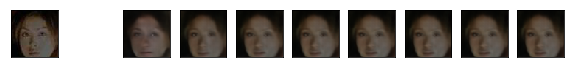

Test Image Name: 182699.jpg


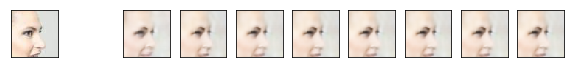

Test Image Name: 182700.jpg


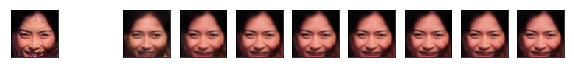

Test Image Name: 182701.jpg


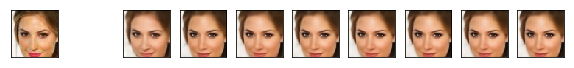

In [10]:
## WARNING: Visualization logic is hardcoded to the value 10, 
#          if you change iterations , visualization logic will need to be changed too
iterations = 10 
num_rand_test=100
x_recovered = np.zeros((num_rand_test, 64,64,3))
A_T = A.T
ctr = 0
for i in range(64):#np.random.choice(range(10000), size=num_rand_test, replace=False):
    plt.figure(figsize=(20, 2))
    print("Test Image Name: {}.jpg".format(i + 182638))
    x_t = np.random.normal(0., 1, (12288,))
    for j in range(iterations):
        v_t = x_t - np.dot(A_T, np.dot(A,x_t) - y[i])
        x_t = autoencoder.predict(v_t.reshape(1,64,64,3))
        
        #Print original image
        if j == 0:
            ax = plt.subplot(1, 20, j / 1 + 1)
            plt.imshow(x_test[i])
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
        
        #Show recovered image at iteration j
        if j % 1== 0 and j > 1:
            ax = plt.subplot(1, 20, j/1 + 1)
            plt.imshow(x_t.reshape(64,64,3))
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            
        x_t = x_t.reshape((12288,))
    
    x_recovered[ctr] = x_t.reshape((64,64,3))
    ctr+=1
    
    plt.show() 

## Compressive Sensing: With Noise

In [30]:
A = (np.random.normal(0, 1/np.sqrt(1000), (1000, 12288)))
y_noise = np.zeros((10000,1000))
for i in range(10000):
    y_noise[i] = np.dot(A, x_test[i].flatten()) + np.random.normal(loc=0.0, scale=1.0, size=1000)

## Algorithm 1 : IPT

Test Image Name: 195484.jpg


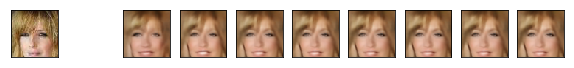

Test Image Name: 196140.jpg


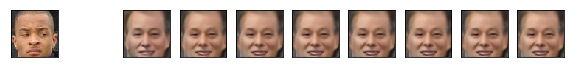

Test Image Name: 196825.jpg


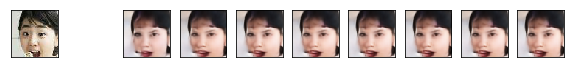

Test Image Name: 193983.jpg


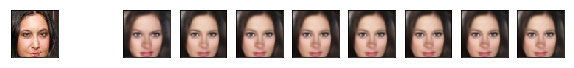

Test Image Name: 195683.jpg


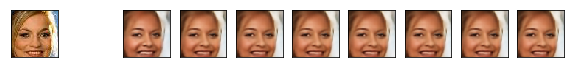

Test Image Name: 198314.jpg


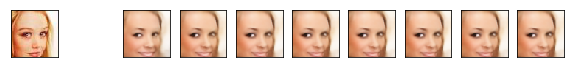

Test Image Name: 190095.jpg


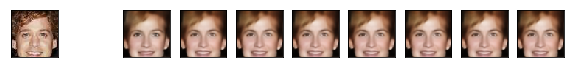

Test Image Name: 193018.jpg


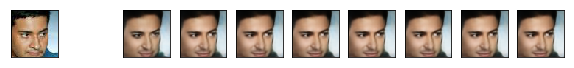

Test Image Name: 198333.jpg


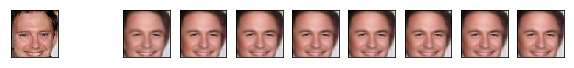

Test Image Name: 194047.jpg


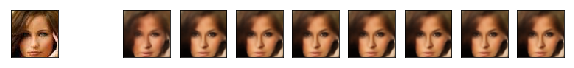

Test Image Name: 198884.jpg


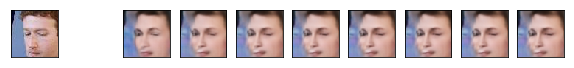

Test Image Name: 191014.jpg


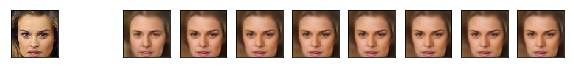

Test Image Name: 197933.jpg


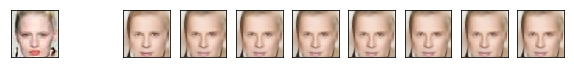

Test Image Name: 199363.jpg


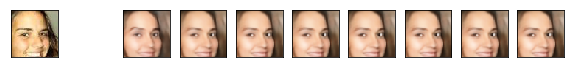

Test Image Name: 192501.jpg


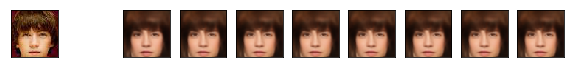

Test Image Name: 194262.jpg


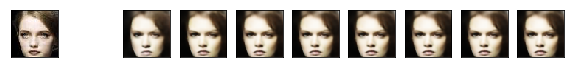

Test Image Name: 190777.jpg


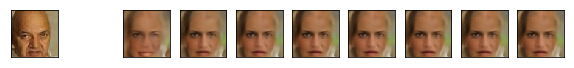

Test Image Name: 196390.jpg


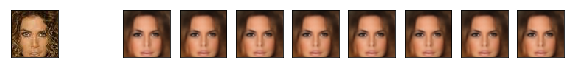

Test Image Name: 194723.jpg


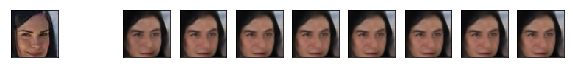

Test Image Name: 196424.jpg


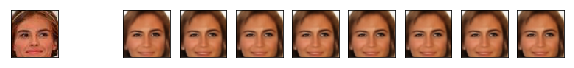

Test Image Name: 191390.jpg


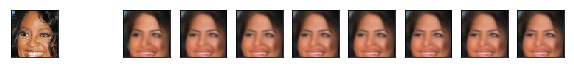

Test Image Name: 197037.jpg


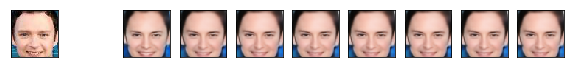

Test Image Name: 197950.jpg


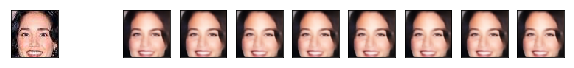

Test Image Name: 193505.jpg


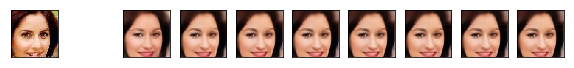

Test Image Name: 196256.jpg


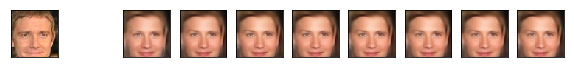

Test Image Name: 195568.jpg


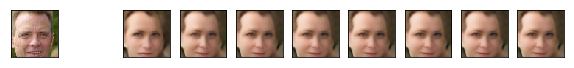

Test Image Name: 195707.jpg


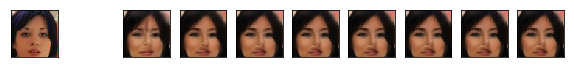

Test Image Name: 193070.jpg


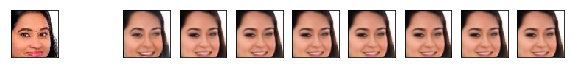

Test Image Name: 198526.jpg


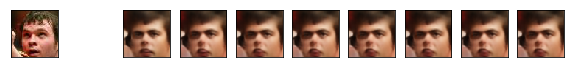

Test Image Name: 196029.jpg


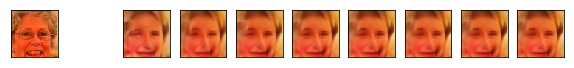

Test Image Name: 193958.jpg


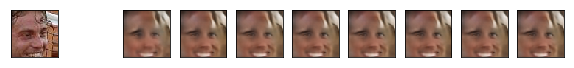

Test Image Name: 196620.jpg


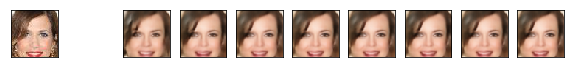

Test Image Name: 198494.jpg


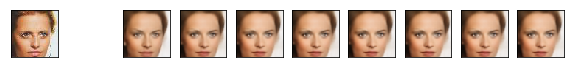

Test Image Name: 199677.jpg


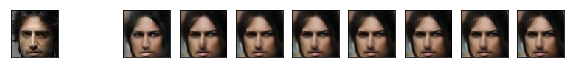

Test Image Name: 191744.jpg


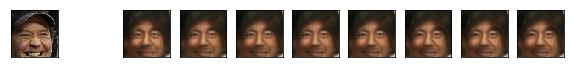

Test Image Name: 191936.jpg


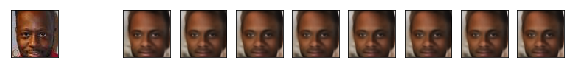

Test Image Name: 194090.jpg


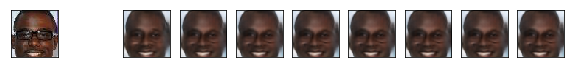

Test Image Name: 195380.jpg


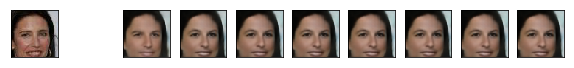

Test Image Name: 199619.jpg


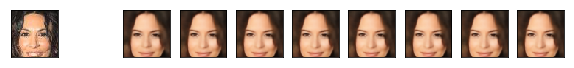

Test Image Name: 193501.jpg


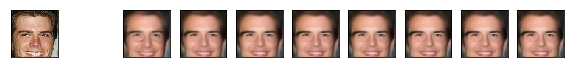

Test Image Name: 194426.jpg


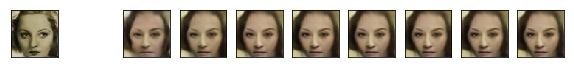

Test Image Name: 190962.jpg


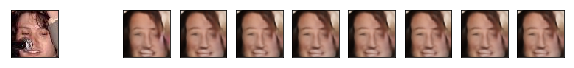

Test Image Name: 191356.jpg


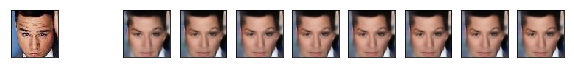

Test Image Name: 196081.jpg


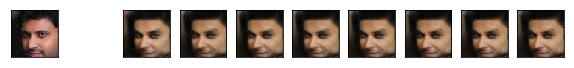

Test Image Name: 197092.jpg


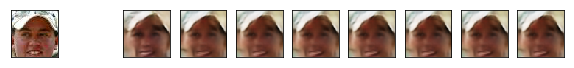

Test Image Name: 199638.jpg


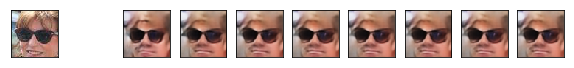

Test Image Name: 199384.jpg


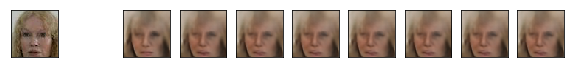

Test Image Name: 198975.jpg


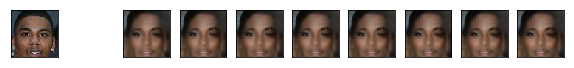

Test Image Name: 194800.jpg


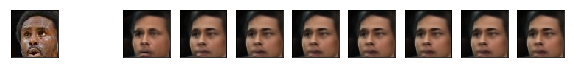

Test Image Name: 195816.jpg


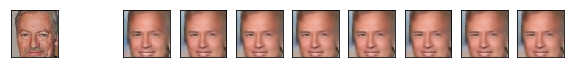

Test Image Name: 196463.jpg


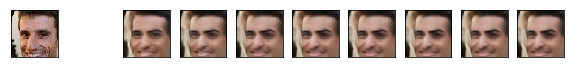

Test Image Name: 193716.jpg


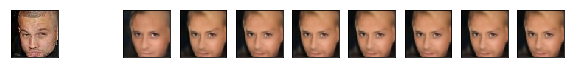

Test Image Name: 195366.jpg


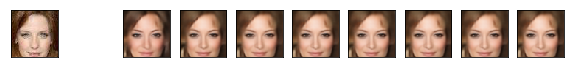

Test Image Name: 197677.jpg


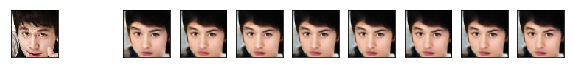

Test Image Name: 190326.jpg


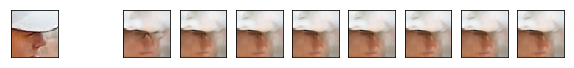

Test Image Name: 195427.jpg


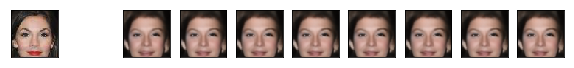

Test Image Name: 193247.jpg


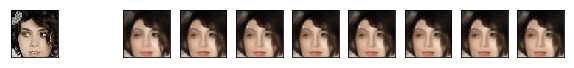

Test Image Name: 191705.jpg


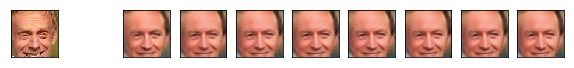

Test Image Name: 192741.jpg


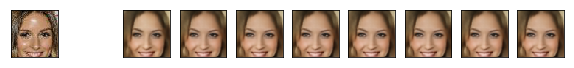

Test Image Name: 197343.jpg


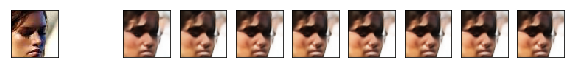

Test Image Name: 199644.jpg


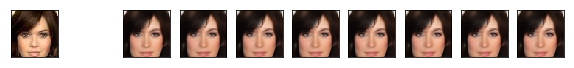

Test Image Name: 195250.jpg


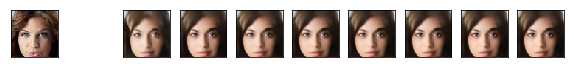

Test Image Name: 194100.jpg


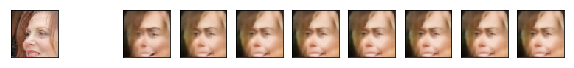

Test Image Name: 197700.jpg


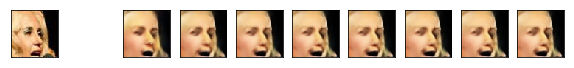

Test Image Name: 191643.jpg


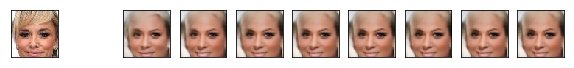

Test Image Name: 194461.jpg


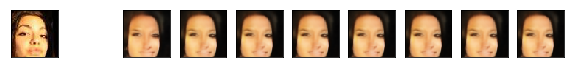

Test Image Name: 195672.jpg


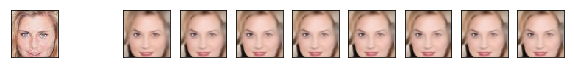

Test Image Name: 195312.jpg


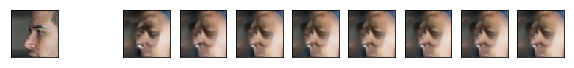

Test Image Name: 191834.jpg


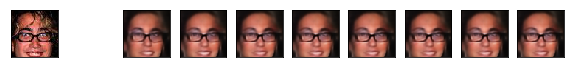

Test Image Name: 197981.jpg


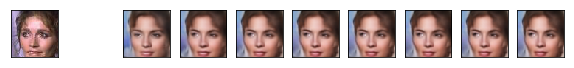

Test Image Name: 199451.jpg


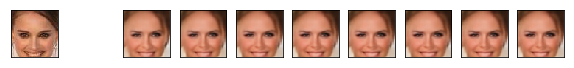

Test Image Name: 196473.jpg


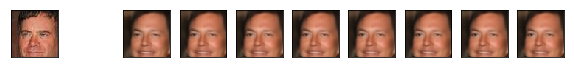

Test Image Name: 198148.jpg


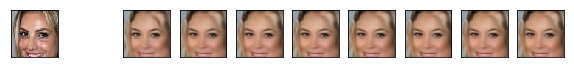

Test Image Name: 192948.jpg


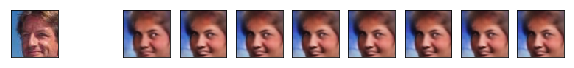

Test Image Name: 194770.jpg


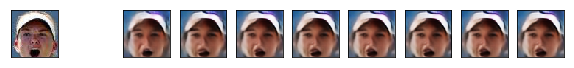

Test Image Name: 196226.jpg


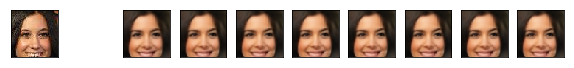

Test Image Name: 193548.jpg


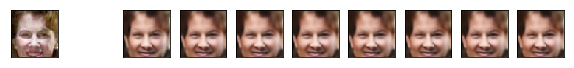

Test Image Name: 192711.jpg


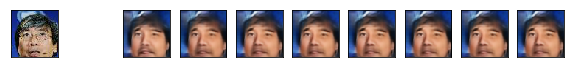

Test Image Name: 196511.jpg


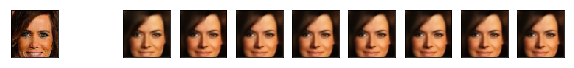

Test Image Name: 199640.jpg


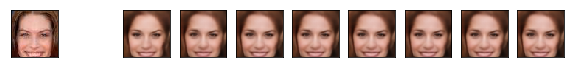

Test Image Name: 194316.jpg


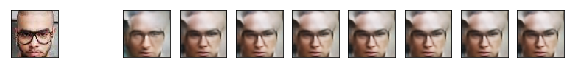

Test Image Name: 192901.jpg


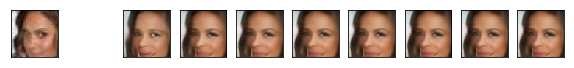

Test Image Name: 196570.jpg


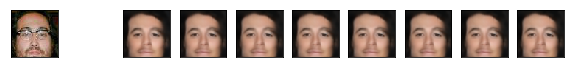

Test Image Name: 198905.jpg


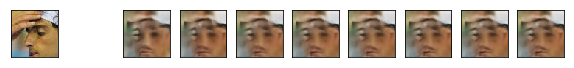

Test Image Name: 195920.jpg


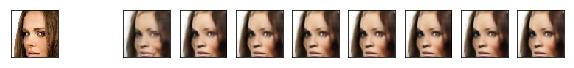

Test Image Name: 197445.jpg


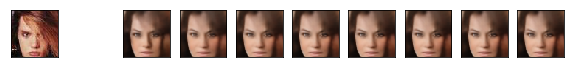

Test Image Name: 191159.jpg


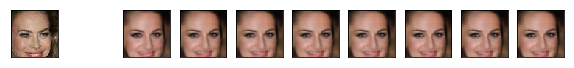

Test Image Name: 191592.jpg


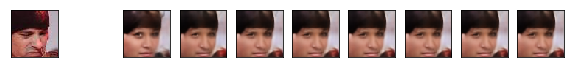

Test Image Name: 196407.jpg


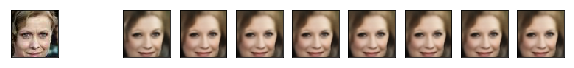

Test Image Name: 199298.jpg


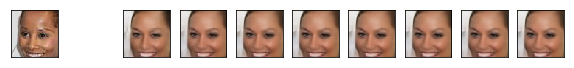

Test Image Name: 198819.jpg


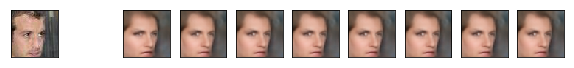

Test Image Name: 195438.jpg


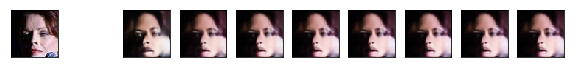

Test Image Name: 199559.jpg


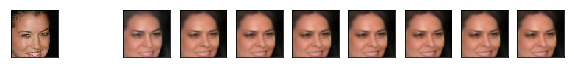

Test Image Name: 197827.jpg


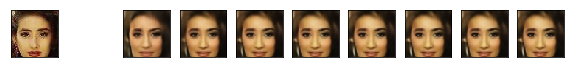

Test Image Name: 197959.jpg


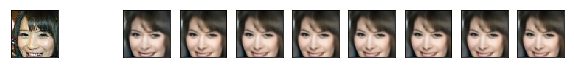

Test Image Name: 197883.jpg


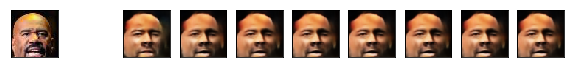

Test Image Name: 193651.jpg


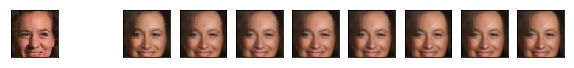

Test Image Name: 190668.jpg


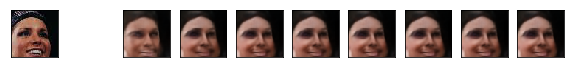

Test Image Name: 198113.jpg


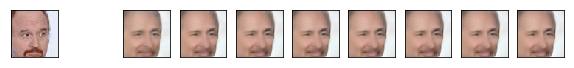

Test Image Name: 194956.jpg


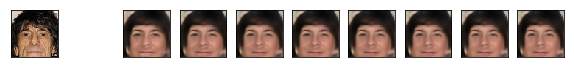

In [31]:
## WARNING: Visualization logic is hardcoded to the value 10, 
#          if you change iterations , visualization logic will need to be changed too
iterations = 10 
num_rand_test=100
x_recovered_noise = np.zeros((num_rand_test, 64,64,3))
A_T = A.T
ctr = 0
for i in np.random.choice(range(10000), size=num_rand_test, replace=False):
    plt.figure(figsize=(20, 2))
    print("Test Image Name: {}.jpg".format(i + 190000))
    x_t = np.random.normal(0., 1, (12288,))
    for j in range(iterations):
        v_t = x_t - np.dot(A_T, np.dot(A,x_t) - y_noise[i])
        x_t = autoencoder.predict(v_t.reshape(1,64,64,3))
        
        #Print original image
        if j == 0:
            ax = plt.subplot(1, 20, j / 1 + 1)
            plt.imshow(x_test[i])
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
        
        #Show recovered image at iteration j
        if j % 1== 0 and j > 1:
            ax = plt.subplot(1, 20, j/1 + 1)
            plt.imshow(x_t.reshape(64,64,3))
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            
        x_t = x_t.reshape((12288,))
    
    x_recovered_noise[ctr] = x_t.reshape((64,64,3))
    ctr+=1
    
    plt.show() 

In [25]:
def get_super_resol_A(factor):
    A = np.zeros(shape=(int(64/factor)**2*3, 64*64*3))
    l = 0
    for i in range(int(64/factor)):
        for j in range(int(64/factor)):
            for k in range(3):
                a = np.zeros(shape=(64, 64, 3))
                a[factor*i:factor*(i+1), factor*j:factor*(j+1), k] = 1/factor**2
                A[l, :] = np.reshape(a, [1, -1])
                l += 1
    return A

def get_inpaint_A(mask_size):
    A = np.ones((3, 64, 64))
    A[:, int(64/2 - mask_size/2):int(64/2 + mask_size/2), int(64/2 - mask_size/2):int(64/2 + mask_size/2)] = 0
    A = A.reshape(-1)
    A = np.diag(A)
    return A

## Superresolution

In [38]:
A = get_super_resol_A(2)
y = np.zeros((64,3072))
for i in range(64):
    y[i] = np.dot(A, x_test[i].flatten()) 

Test Image Name: 182638.jpg


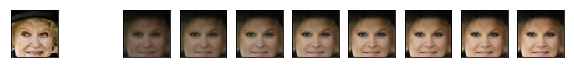

Test Image Name: 182639.jpg


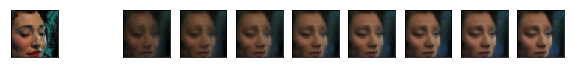

Test Image Name: 182640.jpg


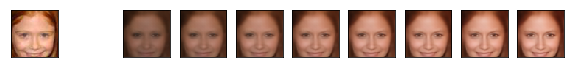

Test Image Name: 182641.jpg


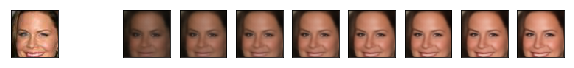

Test Image Name: 182642.jpg


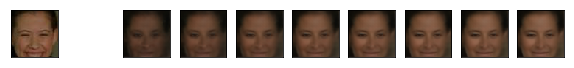

Test Image Name: 182643.jpg


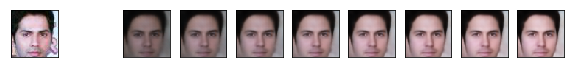

Test Image Name: 182644.jpg


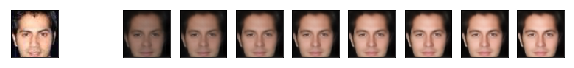

Test Image Name: 182645.jpg


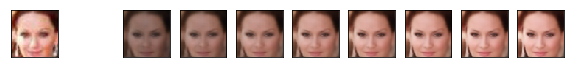

Test Image Name: 182646.jpg


KeyboardInterrupt: 

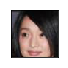

In [39]:
iterations = 10 
num_rand_test=100
x_recovered = np.zeros((num_rand_test, 64,64,3))
A_T = A.T
ctr = 0
for i in range(64):#np.random.choice(range(10000), size=num_rand_test, replace=False):
    plt.figure(figsize=(20, 2))
    print("Test Image Name: {}.jpg".format(i + 182638))
    x_t = np.random.normal(0., 1, (12288,))
    for j in range(iterations):
        v_t = x_t - np.dot(A_T, np.dot(A,x_t) - y[i])
        x_t = autoencoder.predict(v_t.reshape(1,64,64,3))
        
        #Print original image
        if j == 0:
            ax = plt.subplot(1, 20, j / 1 + 1)
            plt.imshow(x_test[i])
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
        
        #Show recovered image at iteration j
        if j % 1== 0 and j > 1:
            ax = plt.subplot(1, 20, j/1 + 1)
            plt.imshow(x_t.reshape(64,64,3))
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            
        x_t = x_t.reshape((12288,))
    
    x_recovered[ctr] = x_t.reshape((64,64,3))
    ctr+=1
    
    plt.show() 

## Inpainting

In [26]:
A = get_inpaint_A(20)


In [27]:
y = np.zeros((64,12288))
for i in range(64):
    y[i] = np.dot(A, x_test[i].flatten()) 

Test Image Name: 182638.jpg


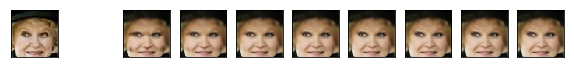

Test Image Name: 182639.jpg


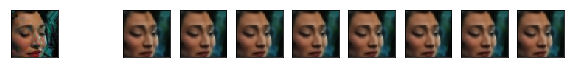

Test Image Name: 182640.jpg


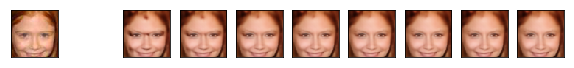

Test Image Name: 182641.jpg


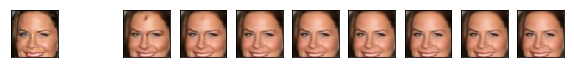

Test Image Name: 182642.jpg


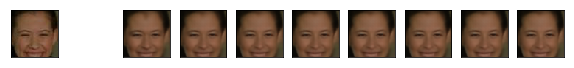

Test Image Name: 182643.jpg


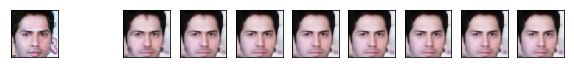

Test Image Name: 182644.jpg


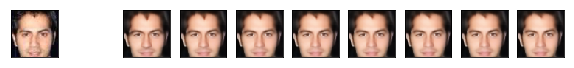

Test Image Name: 182645.jpg


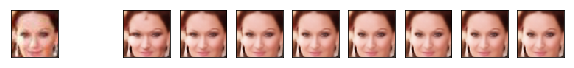

Test Image Name: 182646.jpg


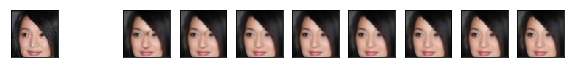

Test Image Name: 182647.jpg


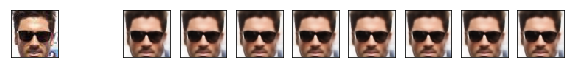

Test Image Name: 182648.jpg


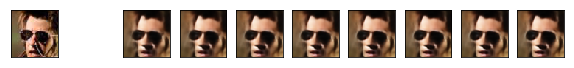

Test Image Name: 182649.jpg


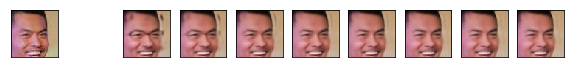

Test Image Name: 182650.jpg


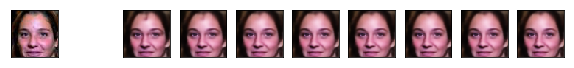

Test Image Name: 182651.jpg


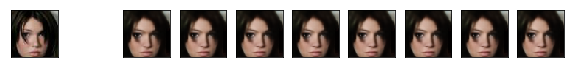

Test Image Name: 182652.jpg


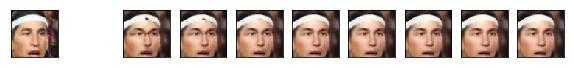

Test Image Name: 182653.jpg


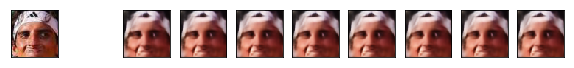

Test Image Name: 182654.jpg


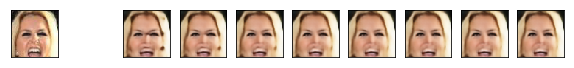

Test Image Name: 182655.jpg


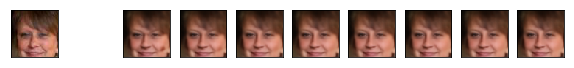

Test Image Name: 182656.jpg


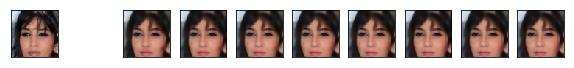

Test Image Name: 182657.jpg


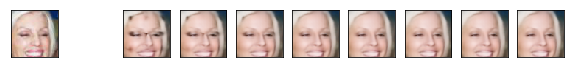

Test Image Name: 182658.jpg


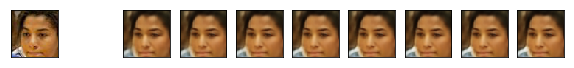

Test Image Name: 182659.jpg


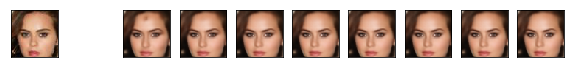

Test Image Name: 182660.jpg


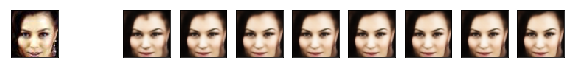

Test Image Name: 182661.jpg


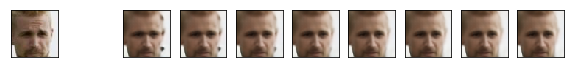

Test Image Name: 182662.jpg


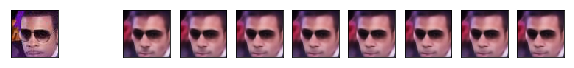

Test Image Name: 182663.jpg


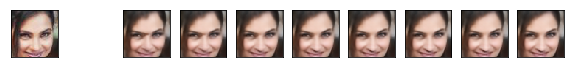

Test Image Name: 182664.jpg


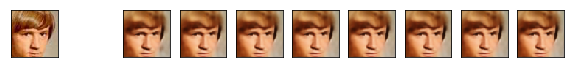

Test Image Name: 182665.jpg


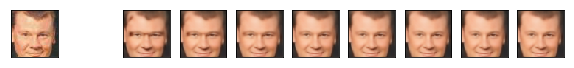

Test Image Name: 182666.jpg


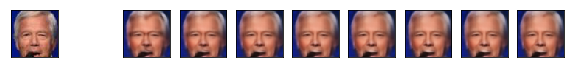

Test Image Name: 182667.jpg


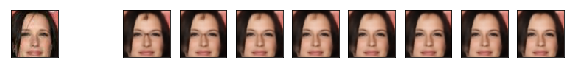

Test Image Name: 182668.jpg


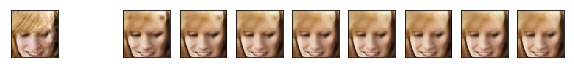

Test Image Name: 182669.jpg


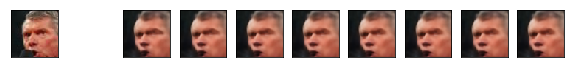

Test Image Name: 182670.jpg


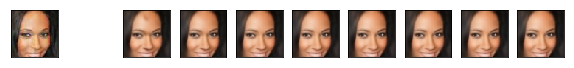

Test Image Name: 182671.jpg


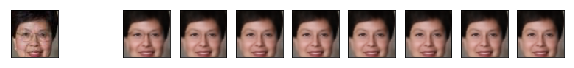

Test Image Name: 182672.jpg


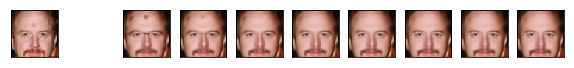

Test Image Name: 182673.jpg


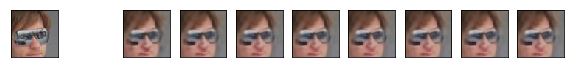

Test Image Name: 182674.jpg


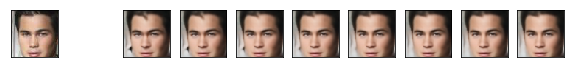

Test Image Name: 182675.jpg


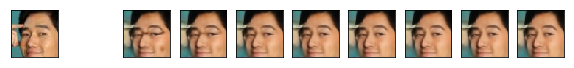

Test Image Name: 182676.jpg


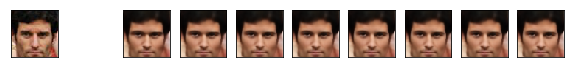

Test Image Name: 182677.jpg


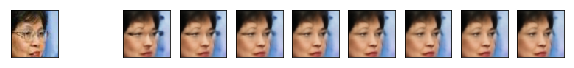

Test Image Name: 182678.jpg


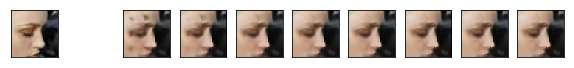

Test Image Name: 182679.jpg


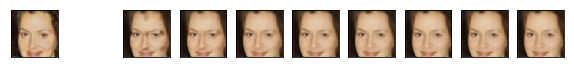

Test Image Name: 182680.jpg


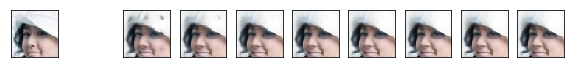

Test Image Name: 182681.jpg


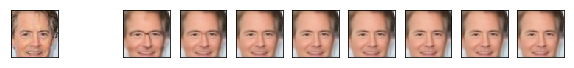

Test Image Name: 182682.jpg


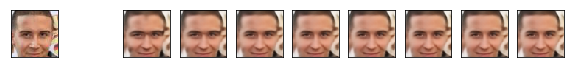

Test Image Name: 182683.jpg


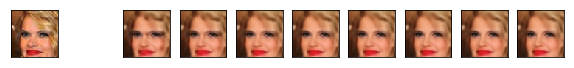

Test Image Name: 182684.jpg


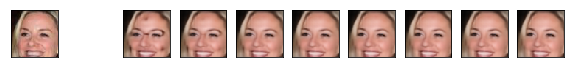

Test Image Name: 182685.jpg


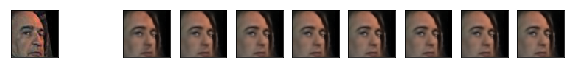

Test Image Name: 182686.jpg


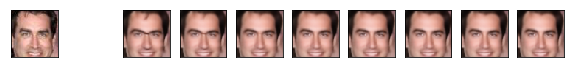

Test Image Name: 182687.jpg


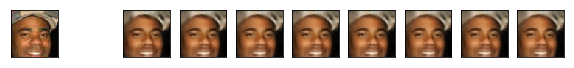

Test Image Name: 182688.jpg


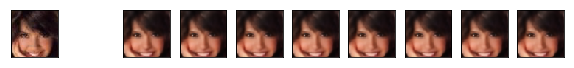

Test Image Name: 182689.jpg


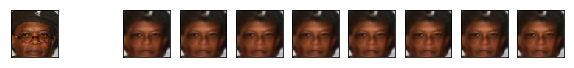

Test Image Name: 182690.jpg


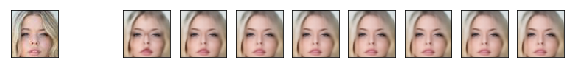

Test Image Name: 182691.jpg


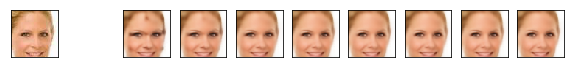

Test Image Name: 182692.jpg


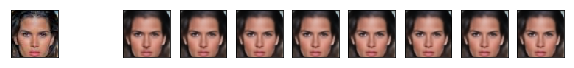

Test Image Name: 182693.jpg


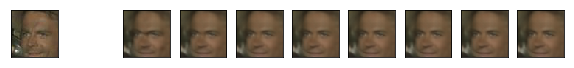

Test Image Name: 182694.jpg


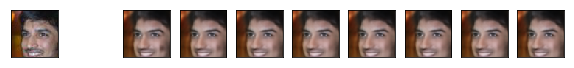

Test Image Name: 182695.jpg


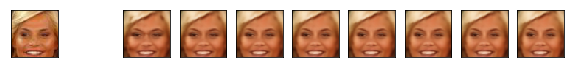

Test Image Name: 182696.jpg


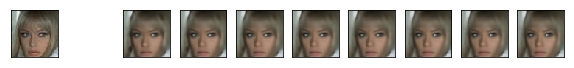

Test Image Name: 182697.jpg


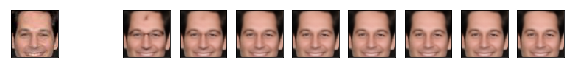

Test Image Name: 182698.jpg


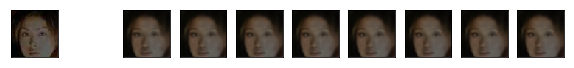

Test Image Name: 182699.jpg


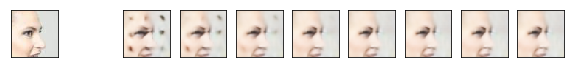

Test Image Name: 182700.jpg


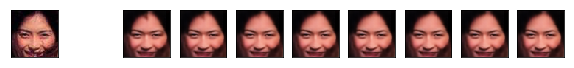

Test Image Name: 182701.jpg


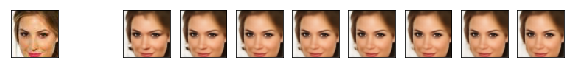

In [29]:
iterations = 10
num_rand_test=100
x_recovered = np.zeros((num_rand_test, 64,64,3))
A_T = A.T
ctr = 0
for i in range(64):#np.random.choice(range(10000), size=num_rand_test, replace=False):
    plt.figure(figsize=(20, 2))
    print("Test Image Name: {}.jpg".format(i + 182638))
    x_t = np.random.normal(0., 1, (12288,))
    for j in range(iterations):
        v_t = x_t - np.dot(A_T, np.dot(A,x_t) - y[i])
        x_t = autoencoder.predict(v_t.reshape(1,64,64,3))
        
        #Print original image
        if j == 0:
            ax = plt.subplot(1, 20, j / 1 + 1)
            plt.imshow(x_test[i])
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
        
        #Show recovered image at iteration j
        if j % 1== 0 and j > 1:
            ax = plt.subplot(1, 20, j/1 + 1)
            plt.imshow(x_t.reshape(64,64,3))
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            
        x_t = x_t.reshape((12288,))
    
    x_recovered[ctr] = x_t.reshape((64,64,3))
    ctr+=1
    
    plt.show() 